In [56]:
!pip3 install scikit-image

Defaulting to user installation because normal site-packages is not writeable


In [2]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from skimage.io import imread
from skimage.transform import resize
from skimage.color import rgb2gray
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

In [3]:
dir = 'Documents/College/clf-data'
categories = ['empty', 'not_empty']

data = []
labels = []

In [4]:
image_empty_sample = imread('Documents/College/clf-data/empty/00000000_00000161.jpg')
plt.imshow(image_empty_sample)
matrix = np.asarray(image_empty_sample) # 3-D matrix with RGB values
matrix.shape
print(matrix[0][0]) # value of first pixel
print(matrix[0][1]) # value of second pixel
print(matrix[0][2]) # value of third pixel
print(image_empty_sample.shape)
print(image_empty_sample.size)

FileNotFoundError: No such file: '/home/chitraksh/Code/Documents/College/clf-data/empty/00000000_00000161.jpg'

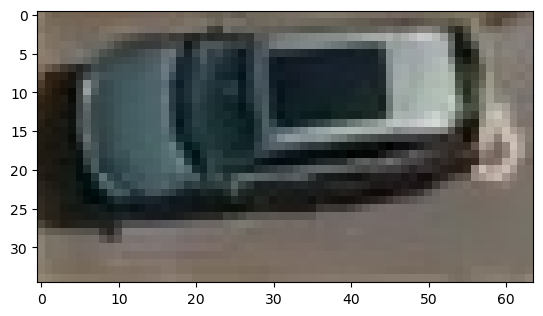

In [4]:
image_notempty_sample = imread('Documents/College/clf-data/not_empty/00000000_00000003.jpg')
plt.imshow(image_notempty_sample)

# Index 0 is mappped to empty and Index 1 is mapped to not_empty as shown below.
## The second loop goes over one file at a time of each directory, resizes it, flattens it to a 1-D array and assigns it to it's respective index (0 for empty, 1 for not_empty)

In [3]:
!rm -r Documents/College/clf-data/empty/.ipynb_checkpoints

rm: cannot remove 'Documents/College/clf-data/empty/.ipynb_checkpoints': No such file or directory


In [34]:
for idx, category in enumerate(categories):
    for file in os.listdir(os.path.join(dir, category)):
        path = os.path.join(dir, category, file)
        print(path)
        image = imread(path)
        image = resize(image, (15, 15))
        data.append(image.flatten()) # takes image and converts it into an array
        labels.append(idx)

Documents/College/clf-data/empty/00000000_00000161.jpg
Documents/College/clf-data/empty/00000000_00000164.jpg
Documents/College/clf-data/empty/00000000_00000179.jpg
Documents/College/clf-data/empty/00000000_00000180.jpg
Documents/College/clf-data/empty/00000000_00000185.jpg
Documents/College/clf-data/empty/00000000_00000201.jpg
Documents/College/clf-data/empty/00000000_00000223.jpg
Documents/College/clf-data/empty/00000000_00000224.jpg
Documents/College/clf-data/empty/00000000_00000271.jpg
Documents/College/clf-data/empty/00000000_00000280.jpg
Documents/College/clf-data/empty/00000000_00000281.jpg
Documents/College/clf-data/empty/00000000_00000303.jpg
Documents/College/clf-data/empty/00000000_00000319.jpg
Documents/College/clf-data/empty/00000000_00000335.jpg
Documents/College/clf-data/empty/00000000_00000341.jpg
Documents/College/clf-data/empty/00000000_00000344.jpg
Documents/College/clf-data/empty/00000000_00000351.jpg
Documents/College/clf-data/empty/00000000_00000360.jpg
Documents/

In [9]:
!ls

bin	 Documents  Music     Public	 Templates  Videos
Desktop  Downloads  Pictures  SVM.ipynb  test.py


In [10]:
!ls -l Documents/College/clf-data/

total 16
drwxrwxr-x. 1 chitraksh chitraksh 127908 Jul  4 21:44 empty
drwxrwxr-x. 1 chitraksh chitraksh 127916 Jul  4 21:44 not_empty
-rw-r--r--. 1 chitraksh chitraksh    449 Jul  4 22:03 not_occupied.png
-rw-r--r--. 1 chitraksh chitraksh   8728 Jul  4 22:20 occupied.png


In [11]:
!ls College/clf-data

ls: cannot access 'College/clf-data': No such file or directory


In [32]:
data.shape

AttributeError: 'list' object has no attribute 'shape'

In [13]:
print(labels)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [35]:
data = np.asarray(data)
labels = np.asarray(labels)

In [6]:
np.unique(labels)

array([0, 1])

In [17]:
data

[array([0.42900875, 0.43685188, 0.39371463, 0.43046174, 0.43830488,
        0.39516762, 0.42813374, 0.43597688, 0.39283962, 0.40350456,
        0.4113477 , 0.36821044, 0.39385169, 0.40169483, 0.35855757,
        0.38242654, 0.39026968, 0.34713243, 0.39250924, 0.40035238,
        0.35721512, 0.40977988, 0.41762301, 0.37448576, 0.39099903,
        0.39884217, 0.35570491, 0.35798007, 0.36585864, 0.32272138,
        0.33404887, 0.34394855, 0.30081129, 0.33320643, 0.34185052,
        0.2988957 , 0.3494432 , 0.35094855, 0.31096667, 0.35134589,
        0.34754218, 0.30765243, 0.35623846, 0.35593084, 0.31597273,
        0.36938808, 0.3769677 , 0.3339622 , 0.38852389, 0.39610351,
        0.35309802, 0.38227321, 0.38985283, 0.34684733, 0.35478003,
        0.36235965, 0.31935415, 0.34438075, 0.35196036, 0.30895487,
        0.3364733 , 0.34405292, 0.30104742, 0.34896491, 0.35654453,
        0.31353903, 0.37987571, 0.38745533, 0.34444984, 0.38779459,
        0.39537421, 0.35236871, 0.36311526, 0.37

In [15]:
data.ndim

2

In [16]:
data.size

4110750

In [17]:
df = pd.DataFrame(data)
df

,0,1,2,3,4,5,6,7,8,9,...,665,666,667,668,669,670,671,672,673,674
0,0.429009,0.436852,0.393715,0.430462,0.438305,0.395168,0.428134,0.435977,0.392840,0.403505,...,0.362850,0.414762,0.414761,0.383389,0.471947,0.471608,0.441254,0.504193,0.501094,0.479289
1,0.462128,0.462128,0.430756,0.442814,0.442814,0.411441,0.432615,0.432615,0.401243,0.421199,...,0.360199,0.306619,0.307326,0.275556,0.227192,0.229482,0.202068,0.189319,0.194178,0.166456
2,0.326473,0.314708,0.279576,0.307729,0.295965,0.266057,0.304295,0.292530,0.265072,0.301989,...,0.342603,0.373290,0.373290,0.341917,0.381488,0.381488,0.350115,0.385309,0.385309,0.353936
3,0.390841,0.390841,0.359468,0.375161,0.375161,0.343789,0.351190,0.351190,0.319818,0.333783,...,0.292056,0.321348,0.321348,0.289976,0.332513,0.332513,0.301141,0.347039,0.347039,0.315667
4,0.363132,0.363132,0.331759,0.383250,0.383250,0.351877,0.380516,0.380516,0.349143,0.371390,...,0.319177,0.347169,0.341253,0.324003,0.336515,0.340157,0.321768,0.322056,0.339528,0.323187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6085,0.456708,0.459593,0.421776,0.498941,0.501369,0.460564,0.260431,0.246007,0.218811,0.227640,...,0.273727,0.330935,0.292677,0.258870,0.362166,0.324856,0.286207,0.422492,0.389681,0.352209
6086,0.308832,0.300121,0.276728,0.332633,0.318267,0.277766,0.251843,0.236129,0.189206,0.433074,...,0.287805,0.301719,0.325898,0.307393,0.289503,0.327934,0.313732,0.293485,0.331510,0.321984
6087,0.334602,0.335695,0.302334,0.328582,0.337826,0.309012,0.316205,0.320886,0.293339,0.188978,...,0.273231,0.232569,0.267020,0.274307,0.233402,0.280694,0.277172,0.237210,0.286463,0.275051
6088,0.303095,0.340410,0.331688,0.363931,0.417743,0.408252,0.315869,0.323695,0.295914,0.348256,...,0.267411,0.287400,0.293057,0.281153,0.286012,0.311371,0.297416,0.301151,0.309920,0.306224


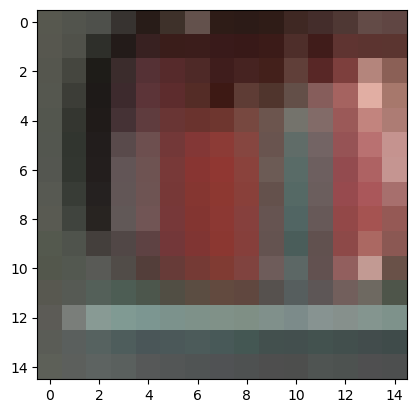

In [18]:
plt.imshow(image)

In [19]:
image

array([[[0.34429221, 0.34741779, 0.31177261],
        [0.32516525, 0.329852  , 0.30310981],
        [0.30958098, 0.31566088, 0.2949556 ],
        [0.21705573, 0.20249979, 0.1891866 ],
        [0.15861792, 0.11258679, 0.09635669],
        [0.24627725, 0.19501431, 0.16597492],
        [0.39069687, 0.32082057, 0.30183377],
        [0.18087506, 0.11350458, 0.09050318],
        [0.17573742, 0.10938196, 0.09125167],
        [0.18648751, 0.11147338, 0.09187863],
        [0.25026097, 0.15801069, 0.1391476 ],
        [0.26795489, 0.17798931, 0.16921467],
        [0.31193117, 0.22290554, 0.20760577],
        [0.39177009, 0.29437619, 0.28134646],
        [0.37990577, 0.27648356, 0.26600082]],

       [[0.34211996, 0.34397338, 0.31250962],
        [0.31543701, 0.32004911, 0.29339608],
        [0.18256858, 0.1868699 , 0.16668536],
        [0.13977609, 0.10883206, 0.10066554],
        [0.22351279, 0.13144423, 0.12996723],
        [0.22886645, 0.11520781, 0.10286774],
        [0.23291804, 0.11603029,

In [20]:
image.size

675

In [21]:
image.ndim

3

In [22]:
data[0]
labels

array([0, 0, 0, ..., 1, 1, 1])

In [36]:
x_train, x_test, y_train, y_test = train_test_split(
    data, 
    labels, 
    test_size=0.2, shuffle=True, stratify=labels
) # stratified sampling basically means that the proportion of labels in the sample dataset reamins the
  # same as that of the original dataset

# Parameters

### Gamma
    Gamma is used when we use Gaussian RBF kernel. Kernel is basically used to project n dimensional space to a n+1 or higher dimensional space when the data is not linearly seperable.
    Spoiler alert, there is a LARGE AMOUNT OF MATH including the Taylor Series in Radial Basis Function kernel. All we have to know that the kernel shows relationship of two data points in higher dimension.

    The values taken below are generally the conventional values since they're hyperparameters and are set before training.

### C
    C defines how big you want the margin to be. Lower values of C means larger margin, and higher value of C means smaller margin. However lower values of C will result in more missclassification since the model will look for larger margin so there is a tradeoff. If C is too high, it may result in overfitting.

In [37]:
model = SVC()

parameters = [
    {
        'gamma': [0.01, 0.001, 0.0001],
        'C': [1, 10, 100, 1000]
    }
]

In [38]:
gridSearch = GridSearchCV(model, parameters)
gridSearch.fit(x_train, y_train)

GridSearchCV(estimator=SVC(),
             param_grid=[{'C': [1, 10, 100, 1000],
                          'gamma': [0.01, 0.001, 0.0001]}])

In [39]:
best_estimator = gridSearch.best_estimator_

In [40]:
best_estimator

SVC(C=100, gamma=0.01)

In [41]:
y_preds = best_estimator.predict(x_test)
score = accuracy_score(y_preds, y_test)
print(score)

0.9991789819376026


In [38]:
y_preds

array([1, 1, 0, ..., 0, 0, 0])

In [55]:
x_test

array([[0.3830095 , 0.38202791, 0.34081727, ..., 0.19659073, 0.19541986,
        0.17436215],
       [0.70347959, 0.54987475, 0.43359517, ..., 0.72396453, 0.72213027,
        0.69134862],
       [0.51721703, 0.47910329, 0.43284368, ..., 0.37372671, 0.35804045,
        0.32274632],
       ...,
       [0.40176759, 0.40176759, 0.37039504, ..., 0.71070931, 0.71070931,
        0.67856027],
       [0.34132027, 0.34078748, 0.31137448, ..., 0.36122597, 0.36135649,
        0.32592883],
       [0.60482545, 0.58735333, 0.54481836, ..., 0.45052256, 0.45052256,
        0.40424791]])

(29, 69, 3)


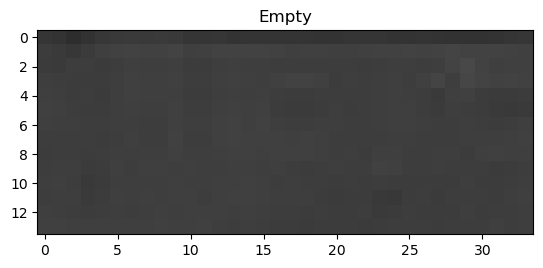

In [49]:
data_ = []
image = imread('/home/chitraksh/Pictures/Screenshots/not_occupied.png')
plt.imshow(image)
image = np.resize(image, (6003,))
image = image.reshape(29, 69, 3)
print(image.shape)
image = resize(image, (15, 15)).flatten()
data_.append(image)
pred = best_estimator.predict(data_)

if pred == [1]:
    plt.title("Not Empty")
else:
    plt.title("Empty")